In [1]:
import tensorflow as tf
from tensorflow import keras
from keras import  layers
import time
import copy

2023-04-07 19:25:09.198813: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-07 19:25:09.363647: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-04-07 19:25:09.406088: E tensorflow/stream_executor/cuda/cuda_blas.cc:2981] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-04-07 19:25:10.169286: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; 

In [2]:
# import tensorflow as tf
import os
import numpy as np
import pandas as pd
from matplotlib import image
from skimage.transform import resize
import matplotlib.pyplot as plt
import nltk
from nltk.tokenize import word_tokenize

In [3]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
import os
os.environ["TF_ENABLE_ONEDNN_OPTS"] = '0'
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
    # Currently, memory growth needs to be the same across GPUs
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
    except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
        print(e)


Num GPUs Available:  1
1 Physical GPUs, 1 Logical GPUs


2023-04-07 19:25:11.876484: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-07 19:25:12.631059: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1616] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 44312 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:98:00.0, compute capability: 8.6


In [4]:
if tf.config.list_physical_devices('GPU'):
  # Returns a dict in the form {'current': <current mem usage>,
  #                             'peak': <peak mem usage>}
    info = tf.config.experimental.get_memory_info('GPU:0')
print(info)

{'current': 0, 'peak': 0}


In [5]:
df = pd.read_csv("captions.txt")
capts_dt = {}
for i in range(len(df["image"])):
    capts_dt[df["image"][i]] = df["caption"][i]

In [6]:
imgs_names = []
folder = "Images/"
for filename in os.listdir(folder):
        imgs_names.append(filename)  
tot_images = []
for x in imgs_names:
    img = image.imread(folder+x)
    img = resize(img,(256,256))
    tot_images.append(img)
tot_images = np.array(tot_images)

In [7]:
corresponding_captions = []

for x in imgs_names:
    corresponding_captions.append(capts_dt[x])

In [7]:
tot_images[7].shape[0]

480

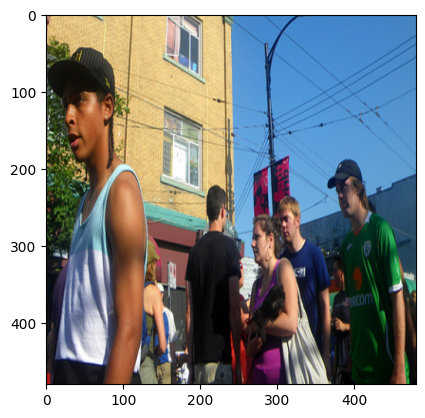

In [8]:
xx = resize(tot_images[4],(480,480))
plt.imshow(xx)

Three UNO cards in reds and yellows in the foreground , with a young boy holding additional cards in the background .


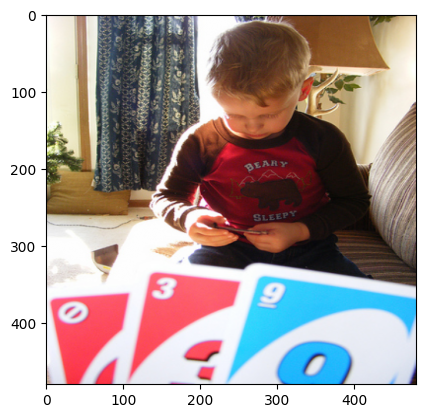

In [43]:
plt.imshow(tot_images[10])
print(corresponding_captions[10])

In [8]:
tot_seqs = []
patch_size = 16
for img in tot_images:
    i = 0
    img_seq = []
    
    img_len = img.shape[0]
    img_wid = img.shape[1]
    
    while(i< img_len):
        j = 0
        while(j< img_wid):
            cur_seq = []
            for x in range(patch_size):
                cur_seq.extend((img[i+x:i+x+1,j:j+patch_size,:]).flatten())
                
            img_seq.append(cur_seq)
            j += patch_size
        i += patch_size
    tot_seqs.append(img_seq)

tot_img_seqs = np.array(tot_seqs)
print(tot_img_seqs.shape)

(8091, 256, 768)


In [10]:
len(tot_seqs[0][0])

768

In [9]:
def build_vocabulary(captions):
    word_dict = {}
    reverse_word_dict = {}
    
    i = 0
    max_sent_size = -float('inf')
    
    frequency = {}
        
    for sent in captions:
        words = word_tokenize(sent)
        
        
        
        if(len(words)>max_sent_size):
            max_sent_size = len(words)
            
        for w in words:
            
            if(len(w)<2):
                continue
                
            if(w in frequency):
                frequency[w] += 1
            else:
                frequency[w] = 1
            
            if(w in word_dict):
                continue
            word_dict[w] = i
            reverse_word_dict[i] = w
            i += 1
        
    sorted_frequency = list(frequency.items())
    sorted_frequency.sort(key = lambda x:x[1])
    
    print(len(word_dict))
    
    for w,f in sorted_frequency[:-10000]:
        word_dict.pop(w)
        
        
    word_dict["<STR>"] = i 
    reverse_word_dict[i] = "<STR>"
    
    word_dict["<END>"] = i+1
    reverse_word_dict[i+1] = "<END>"
    
    word_dict["<PAD>"] = i+2
    reverse_word_dict[i+2] = "<PAD>"
    
    
    
    return word_dict,reverse_word_dict,max_sent_size


def tokenize(captions,word_dict):
    
    tokenized_capts = []
    
    for sent in captions:
        words = word_tokenize(sent)
        cur_sent = [word_dict["<STR>"]]
        for w in words:
            if(w not in word_dict):
                continue
            cur_sent.append(word_dict[w])
        cur_sent.append(word_dict["<END>"])
        
        tokenized_capts.append(cur_sent + [word_dict["<PAD>"]] * (max_sent_size + 3 - len(cur_sent)))
            
    return tokenized_capts

word_dict,reverse_word_dict,max_sent_size= build_vocabulary(corresponding_captions)
tokenized_capts = tokenize(corresponding_captions,word_dict)
            
tokenized_capts = np.array(tokenized_capts)
print(tokenized_capts.shape,len(word_dict))     


4800
(8091, 41) 4803


In [45]:
reverse_word_dict[4825]

'<END>'

In [9]:
len(reverse_word_dict)

4827

In [10]:
onehot_capts = tf.one_hot(tokenized_capts, len(word_dict))
onehot_capts_numpy = onehot_capts.numpy()

In [14]:
print(onehot_capts_numpy.shape)

(8091, 41, 4803)


In [11]:

def positional_encoding(length = 2048, depth = 512):
    depth = depth/2

    positions = np.arange(length)[:, np.newaxis]     # (seq, 1)
    depths = np.arange(depth)[np.newaxis, :]/depth   # (1, depth)

    angle_rates = 1 / (10000**depths)         # (1, depth)
    angle_rads = positions * angle_rates      # (pos, depth)

    pos_encoding = np.concatenate([np.sin(angle_rads), np.cos(angle_rads)],axis=-1) 

    return tf.cast(pos_encoding, dtype=tf.float32)

class PositionalEmbeddingCapts(tf.keras.layers.Layer):
    def __init__(self, vocab_size, d_model, indicator):
        super().__init__()
        self.d_model = d_model
        self.embedding = tf.keras.layers.Embedding(vocab_size, d_model, mask_zero=True) 
        self.pos_encoding = positional_encoding(length=2048, depth=d_model)
        self.indicator = indicator

    def compute_mask(self, *args, **kwargs):
        return self.embedding.compute_mask(*args, **kwargs)

    def call(self, x):
        length = tf.shape(x)[1]
        x = self.embedding(x)
                
    # This factor sets the relative scale of the embedding and positonal_encoding.
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x = x + self.pos_encoding[tf.newaxis, :length, :]
        return x
    
class PositionalEmbeddingImages(tf.keras.layers.Layer):
    def __init__(self, vocab_size, d_model, indicator):
        super().__init__()
        self.d_model = d_model
#         self.embedding = tf.keras.layers.Embedding(vocab_size, d_model, mask_zero=True) 
        self.pos_encoding = positional_encoding(length=2048, depth=d_model)
        self.indicator = indicator

#     def compute_mask(self, *args, **kwargs):
#         return self.embedding.compute_mask(*args, **kwargs)

    def call(self, x):
        length = tf.shape(x)[1]                
    # This factor sets the relative scale of the embedding and positonal_encoding.
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x = x + self.pos_encoding[tf.newaxis, :length, :]
        return x
    
    

In [12]:
class create_encoder_block(keras.Model):
    def __init__(self,dns,activ,**kwargs):
        super(create_encoder_block,self).__init__(**kwargs)
        self.attention_self = keras.layers.MultiHeadAttention(8,dns)
        self.norm1 = keras.layers.LayerNormalization()
        self.add = keras.layers.Add()
        self.dense = keras.layers.Dense(dns,activation = activ)
        self.norm2 = keras.layers.LayerNormalization()
        
    def call(self,inp):
        
        self_att_vecs,self_att_scores = self.attention_self(inp,inp,return_attention_scores = True)
        
        residual_vals1 = self.add([inp,self_att_vecs])
        
        normalized_resids1 = self.norm1(residual_vals1)
        
        dense_outs = self.dense(normalized_resids1)
        
        residual_vals2 = self.add([dense_outs,normalized_resids1])
        
        normalized_resids2 = self.norm2(residual_vals2)
        
        return normalized_resids2
    
class create_decoder_block(keras.Model):
    def __init__(self,dns,activ,**kwargs):
        super(create_decoder_block,self).__init__(**kwargs)
        self.attention_self = keras.layers.MultiHeadAttention(8,dns)
        self.attention_cross = keras.layers.MultiHeadAttention(8,dns)
        self.add = keras.layers.Add()
        self.dense = keras.layers.Dense(dns,activation = activ)
        self.norm1 = keras.layers.LayerNormalization()
        self.norm2 = keras.layers.LayerNormalization()
        self.norm3 = keras.layers.LayerNormalization()
        
    def call(self,dec_inp,enc_out):
        
        self_att_vecs,self_att_scores = self.attention_self(dec_inp,dec_inp,use_causal_mask = True,return_attention_scores = True)
        
        resids_self = self.add([self_att_vecs,dec_inp])
        
        normalized_self = self.norm1(resids_self)
        
        cross_att_vecs,cross_att_scores = self.attention_cross(normalized_self,enc_out,return_attention_scores = True)
        
        resids_cross = self.add([cross_att_vecs,normalized_self])
        
        normalized_cross = self.norm2(resids_cross)
        
        feed_forward = self.dense(normalized_cross)
        
        resids_3 = self.add([normalized_cross,feed_forward])
        
        normalized_3 = self.norm3(resids_3)
        
        
        return normalized_3
    
    

In [13]:
class create_encoder_stack(keras.Model):
    def __init__(self,dns,activ,enc_stk_len,**kwargs):
        super(create_encoder_stack,self).__init__()
        self.enc_stk = []
        for i in range(enc_stk_len):
            self.enc_stk.append(create_encoder_block(dns,activ))
            
    def call(self,inp):
        x = inp
        for enc_block in self.enc_stk:
            x = enc_block(x)
            
        return x
            
class create_decoder_stack(keras.Model):
    def __init__(self,dns,activ,enc_stk_len,**kwargs):
        super(create_decoder_stack,self).__init__()
        self.dec_stk = []
        for i in range(enc_stk_len):
            self.dec_stk.append(create_decoder_block(dns,activ))
            
    def call(self,dec_inp,enc_out):
        x = dec_inp
        for dec_block in self.dec_stk:
            x = dec_block(x,enc_out)
            
#         self.att_scores = 
            
        return x
            

In [14]:
class transformer(keras.Model):
    def __init__(self,dns,activ,enc_stk_len,dec_stk_len,linear_proj_len,**kwargs):
        super(transformer,self).__init__(**kwargs)
        
        
        self.enc_stk = create_encoder_stack(linear_proj_len,activ,enc_stk_len)
        self.dec_stk = create_decoder_stack(dns,activ,dec_stk_len)
        
        self.linear_proj = keras.layers.Dense(linear_proj_len)
    
        self.img_pos_encoder = PositionalEmbeddingImages(len(word_dict),linear_proj_len,0)
        self.capts_pos_encoder = PositionalEmbeddingCapts(len(word_dict),dns,1)
        
            
        self.softmax = keras.layers.Dense(len(word_dict),activation = "softmax")
  
    def call(self,inp,out):
        
        lin_projs = self.linear_proj(inp)
        img_pos_embs = self.img_pos_encoder(lin_projs)
        

        enc_out = self.enc_stk(img_pos_embs)
        
        capts_pos_embs = self.capts_pos_encoder(out)

        dec_out = self.dec_stk(capts_pos_embs,enc_out)
        
        out = self.softmax(dec_out)


        return out
        
        
        
        
        
        

In [15]:


def train_transformer(pos_xx,pos_yy,yy,model):
    emb_x = copy.deepcopy(pos_xx)        #position enocded vectors of input dates
    emb_y = copy.deepcopy(pos_yy)        #position encoded vectors of target dates
    ohv_y = copy.deepcopy(yy)            #onehot vectors for target dates
    tot_losses = []
    print("training started")
    for x in range(epochs):
        ep_loss = 0
        index = 0
        while(index<len(yy)):
            d = emb_x[index:index+batch_size]
            y = emb_y[index:index+batch_size]
            loss_y = ohv_y[index:index+batch_size]
            
            index += batch_size
            with tf.GradientTape() as tp:
                pred = model(d,y[:,:-1])
                ls = loss(loss_y[:,1:,:],pred)
            grads = tp.gradient(ls,model.trainable_weights) 
            optim.apply_gradients(zip(grads,model.trainable_weights))
            ep_loss += ls
#             print(ep_loss)

        inds = np.arange(0,len(emb_x))
        np.random.shuffle(inds)
        emb_x = emb_x[inds]
        emb_y = emb_y[inds]
        ohv_y = ohv_y[inds]
            
        print("epoch : ", x, "loss : ", ep_loss/(len(emb_x)/batch_size))
        tot_losses.append(ep_loss/(len(emb_x)/batch_size))
    return tot_losses

In [16]:
def get_date_trans(inp,model):
            
        
        tokens = [word_dict["<STR>"]]

#         nex_pos_enc = pos(np.expand_dims(np.array(tokens),axis = 0))
        nex_pos_enc = model.capts_pos_encoder(np.expand_dims(np.array(tokens),axis = 0))
    
        lin_projs = model.linear_proj(inp)
        img_pos_embs = model.img_pos_encoder(lin_projs)
        
        enc_out = model.enc_stk(img_pos_embs)
        
        ch = '<STR>'
        cnt = 0
        t_att_scores11 = []
        t_att_scores21 = []
        t_att_scores31 = []
        
        t_att_scores12,t_att_scores22,t_att_scores32 = [],[],[]
        
        ans = [ch]
        
        result_scores = []
        
#         capts_pos_embs = self.capts_pos_encoder(out)
        
#         cur_tokens = [word_dict["<STR>"]]
        while(ch != "<END>"):
            
            if(cnt == 35):
                break
            cnt += 1
            
            dec_out = model.dec_stk(nex_pos_enc,enc_out)
            
#             result_scores.append(model.dec_stk.att_scores)

            out = model.softmax(dec_out) 
            
            ind = tf.argmax(out[:,-1:,:],axis = 2)
            ch = reverse_word_dict[int(ind)]
            ans.append(ch)
#             print(ch)
            tokens.append(ind[0][0])
#             cur_tokens.append(ind[0][0])
            
            nex_pos_enc = model.capts_pos_encoder(np.expand_dims(np.array(tokens),axis = 0))
#             nex_pos_enc = pos(np.expand_dims(np.array(tokens),axis = 0))
   
        
        return " ".join(ans[1:]),result_scores,[t_att_scores11,t_att_scores21,t_att_scores31], [t_att_scores12,t_att_scores22,t_att_scores32]
        


In [17]:
# del trans_model

In [19]:
epochs = 300
batch_size = 64
linear_proj_len = 512

optim = keras.optimizers.Adagrad()
loss = keras.losses.CategoricalCrossentropy()

trans_model = transformer(512,"gelu",4,4,linear_proj_len)

losses = train_transformer(tot_img_seqs[:8000],tokenized_capts[:8000],onehot_capts_numpy[:8000],trans_model)


training started
epoch :  0 loss :  tf.Tensor(2.4987292, shape=(), dtype=float32)
epoch :  1 loss :  tf.Tensor(1.9930167, shape=(), dtype=float32)
epoch :  2 loss :  tf.Tensor(1.8710127, shape=(), dtype=float32)
epoch :  3 loss :  tf.Tensor(1.7948643, shape=(), dtype=float32)
epoch :  4 loss :  tf.Tensor(1.7442304, shape=(), dtype=float32)
epoch :  5 loss :  tf.Tensor(1.7080123, shape=(), dtype=float32)
epoch :  6 loss :  tf.Tensor(1.680077, shape=(), dtype=float32)
epoch :  7 loss :  tf.Tensor(1.657162, shape=(), dtype=float32)
epoch :  8 loss :  tf.Tensor(1.6375234, shape=(), dtype=float32)
epoch :  9 loss :  tf.Tensor(1.620245, shape=(), dtype=float32)
epoch :  10 loss :  tf.Tensor(1.6048104, shape=(), dtype=float32)
epoch :  11 loss :  tf.Tensor(1.590863, shape=(), dtype=float32)
epoch :  12 loss :  tf.Tensor(1.5781624, shape=(), dtype=float32)
epoch :  13 loss :  tf.Tensor(1.5665178, shape=(), dtype=float32)
epoch :  14 loss :  tf.Tensor(1.555765, shape=(), dtype=float32)
epoch : 

The man is wearing red shirt and white dog is standing in the air <END>


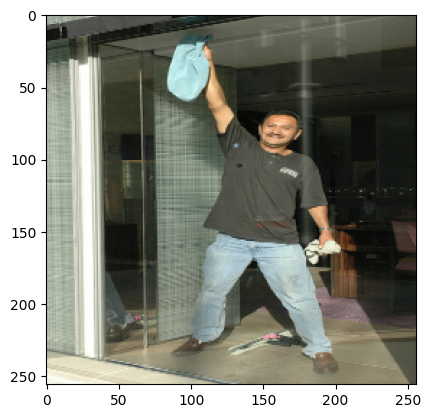

In [20]:
x = 1000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is wearing red shirt and white dog is standing in the air <END>


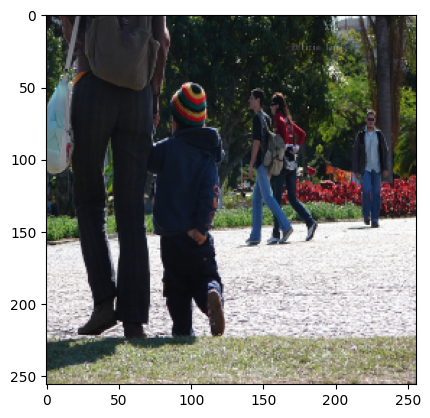

In [21]:
x = 2000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is wearing blue shirt and blue shirt and white dog <END>


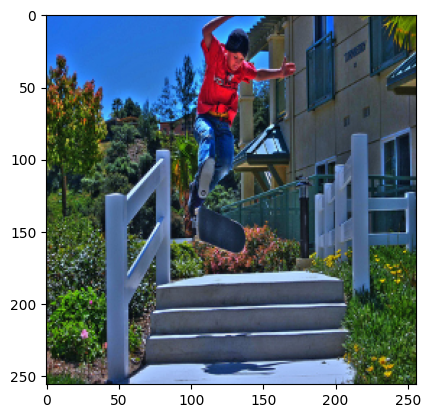

In [22]:
x = 3000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

In [23]:


losses = train_transformer(tot_img_seqs[:8000],tokenized_capts[:8000],onehot_capts_numpy[:8000],trans_model)


training started
epoch :  0 loss :  tf.Tensor(1.1197717, shape=(), dtype=float32)
epoch :  1 loss :  tf.Tensor(1.119299, shape=(), dtype=float32)
epoch :  2 loss :  tf.Tensor(1.118796, shape=(), dtype=float32)
epoch :  3 loss :  tf.Tensor(1.1182884, shape=(), dtype=float32)
epoch :  4 loss :  tf.Tensor(1.1178254, shape=(), dtype=float32)
epoch :  5 loss :  tf.Tensor(1.117304, shape=(), dtype=float32)
epoch :  6 loss :  tf.Tensor(1.1168509, shape=(), dtype=float32)
epoch :  7 loss :  tf.Tensor(1.116363, shape=(), dtype=float32)
epoch :  8 loss :  tf.Tensor(1.1158881, shape=(), dtype=float32)
epoch :  9 loss :  tf.Tensor(1.1154072, shape=(), dtype=float32)
epoch :  10 loss :  tf.Tensor(1.1149507, shape=(), dtype=float32)
epoch :  11 loss :  tf.Tensor(1.114447, shape=(), dtype=float32)
epoch :  12 loss :  tf.Tensor(1.1139816, shape=(), dtype=float32)
epoch :  13 loss :  tf.Tensor(1.1135123, shape=(), dtype=float32)
epoch :  14 loss :  tf.Tensor(1.1130122, shape=(), dtype=float32)
epoch : 

The man is wearing black shirt and white dog <END>


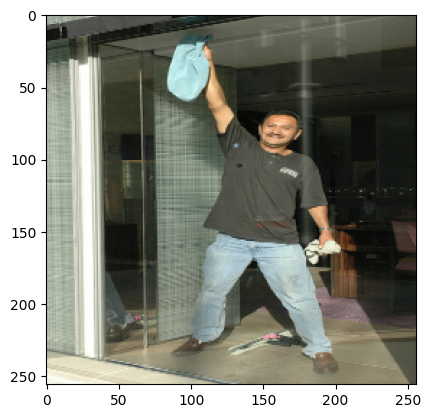

In [24]:
x = 1000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is wearing black shirt and white shirt and white dog <END>


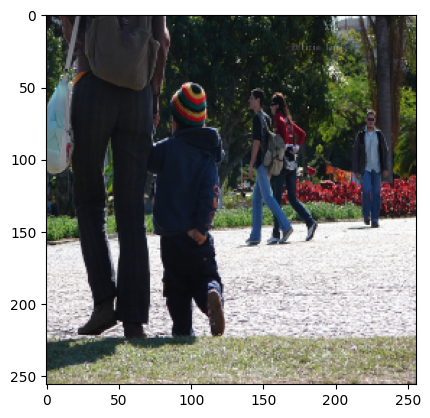

In [25]:
x = 2000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is wearing blue shirt and blue shirt and blue shirt and blue shirt and blue shirt <END>


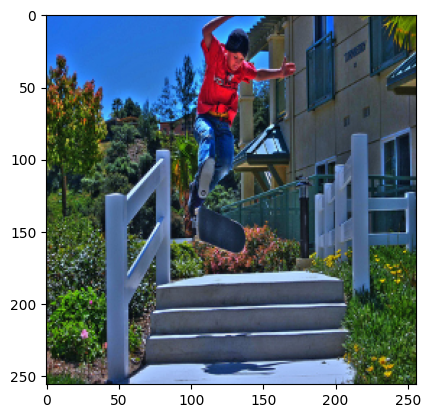

In [26]:
x = 3000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

In [27]:


losses = train_transformer(tot_img_seqs[:8000],tokenized_capts[:8000],onehot_capts_numpy[:8000],trans_model)


training started
epoch :  0 loss :  tf.Tensor(1.0085843, shape=(), dtype=float32)
epoch :  1 loss :  tf.Tensor(1.0082402, shape=(), dtype=float32)
epoch :  2 loss :  tf.Tensor(1.007956, shape=(), dtype=float32)
epoch :  3 loss :  tf.Tensor(1.0076611, shape=(), dtype=float32)
epoch :  4 loss :  tf.Tensor(1.0073502, shape=(), dtype=float32)
epoch :  5 loss :  tf.Tensor(1.0070401, shape=(), dtype=float32)
epoch :  6 loss :  tf.Tensor(1.006732, shape=(), dtype=float32)
epoch :  7 loss :  tf.Tensor(1.0064391, shape=(), dtype=float32)
epoch :  8 loss :  tf.Tensor(1.0061466, shape=(), dtype=float32)
epoch :  9 loss :  tf.Tensor(1.0058392, shape=(), dtype=float32)
epoch :  10 loss :  tf.Tensor(1.0055147, shape=(), dtype=float32)
epoch :  11 loss :  tf.Tensor(1.0052463, shape=(), dtype=float32)
epoch :  12 loss :  tf.Tensor(1.0049336, shape=(), dtype=float32)
epoch :  13 loss :  tf.Tensor(1.0046597, shape=(), dtype=float32)
epoch :  14 loss :  tf.Tensor(1.004359, shape=(), dtype=float32)
epoch 

The man is wearing black shirt and white shirt and white dog <END>


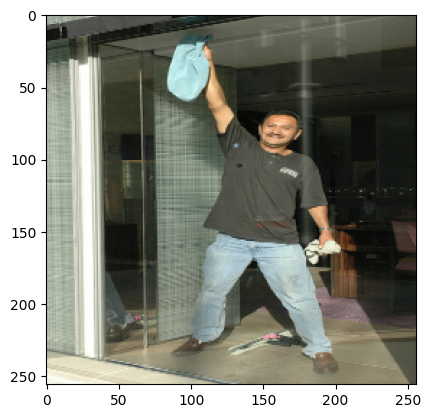

In [28]:
x = 1000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is wearing black shirt and white shirt and white dog <END>


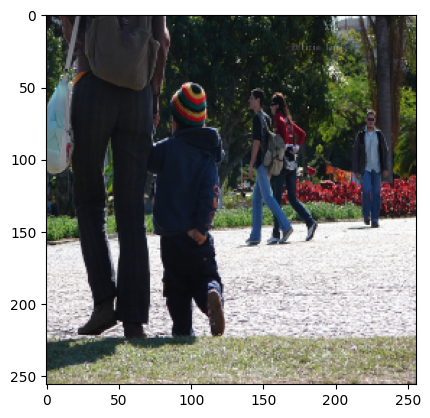

In [29]:
x = 2000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The girl is wearing red shirt and blue shirt and blue shirt and blue shirt <END>


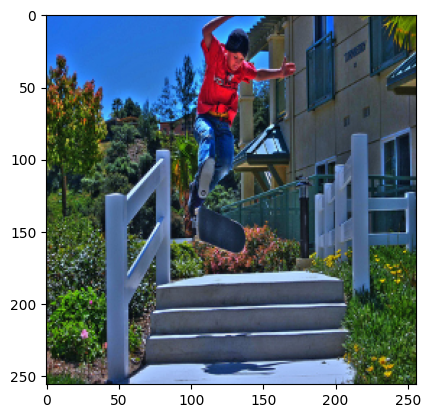

In [30]:
x = 3000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

In [31]:


losses = train_transformer(tot_img_seqs[:8000],tokenized_capts[:8000],onehot_capts_numpy[:8000],trans_model)


training started
epoch :  0 loss :  tf.Tensor(0.9255253, shape=(), dtype=float32)
epoch :  1 loss :  tf.Tensor(0.9251683, shape=(), dtype=float32)
epoch :  2 loss :  tf.Tensor(0.92495567, shape=(), dtype=float32)
epoch :  3 loss :  tf.Tensor(0.9246241, shape=(), dtype=float32)
epoch :  4 loss :  tf.Tensor(0.92433274, shape=(), dtype=float32)
epoch :  5 loss :  tf.Tensor(0.92408764, shape=(), dtype=float32)
epoch :  6 loss :  tf.Tensor(0.9238466, shape=(), dtype=float32)
epoch :  7 loss :  tf.Tensor(0.92362684, shape=(), dtype=float32)
epoch :  8 loss :  tf.Tensor(0.9234294, shape=(), dtype=float32)
epoch :  9 loss :  tf.Tensor(0.92316645, shape=(), dtype=float32)
epoch :  10 loss :  tf.Tensor(0.92278874, shape=(), dtype=float32)
epoch :  11 loss :  tf.Tensor(0.92254865, shape=(), dtype=float32)
epoch :  12 loss :  tf.Tensor(0.9222998, shape=(), dtype=float32)
epoch :  13 loss :  tf.Tensor(0.92191476, shape=(), dtype=float32)
epoch :  14 loss :  tf.Tensor(0.9217159, shape=(), dtype=floa

Two men in black and white shirt are standing in front of the camera <END>


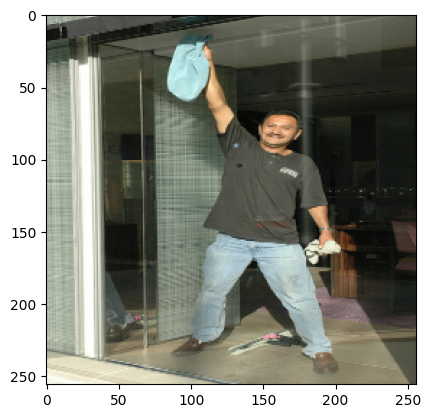

In [32]:
x = 1000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is wearing black shirt and white shirt and white dog <END>


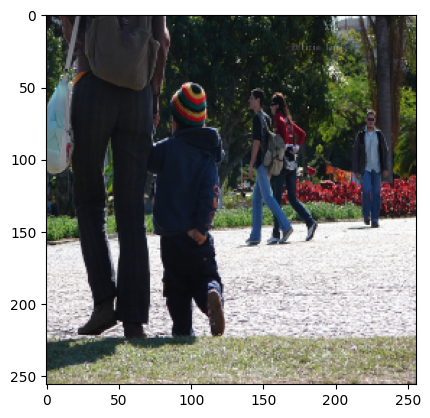

In [33]:
x = 2000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is wearing blue shirt and blue shirt and blue shirt <END>


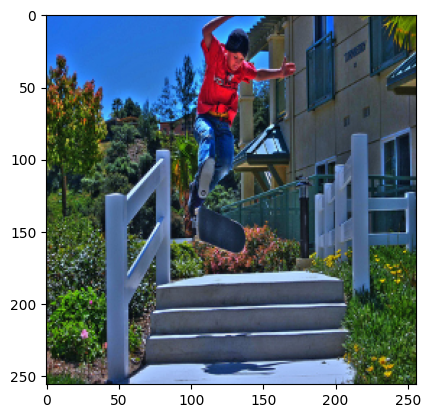

In [34]:
x = 3000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

In [35]:


losses = train_transformer(tot_img_seqs[:8000],tokenized_capts[:8000],onehot_capts_numpy[:8000],trans_model)


training started
epoch :  0 loss :  tf.Tensor(0.84643483, shape=(), dtype=float32)
epoch :  1 loss :  tf.Tensor(0.84569484, shape=(), dtype=float32)
epoch :  2 loss :  tf.Tensor(0.8459011, shape=(), dtype=float32)
epoch :  3 loss :  tf.Tensor(0.8456059, shape=(), dtype=float32)
epoch :  4 loss :  tf.Tensor(0.8451003, shape=(), dtype=float32)
epoch :  5 loss :  tf.Tensor(0.84493864, shape=(), dtype=float32)
epoch :  6 loss :  tf.Tensor(0.84445506, shape=(), dtype=float32)
epoch :  7 loss :  tf.Tensor(0.8442817, shape=(), dtype=float32)
epoch :  8 loss :  tf.Tensor(0.84392303, shape=(), dtype=float32)
epoch :  9 loss :  tf.Tensor(0.84372795, shape=(), dtype=float32)
epoch :  10 loss :  tf.Tensor(0.843646, shape=(), dtype=float32)
epoch :  11 loss :  tf.Tensor(0.84314716, shape=(), dtype=float32)
epoch :  12 loss :  tf.Tensor(0.8425529, shape=(), dtype=float32)
epoch :  13 loss :  tf.Tensor(0.842519, shape=(), dtype=float32)
epoch :  14 loss :  tf.Tensor(0.8421177, shape=(), dtype=float32

Two men in black and white shirt are standing in front of building in front of them <END>


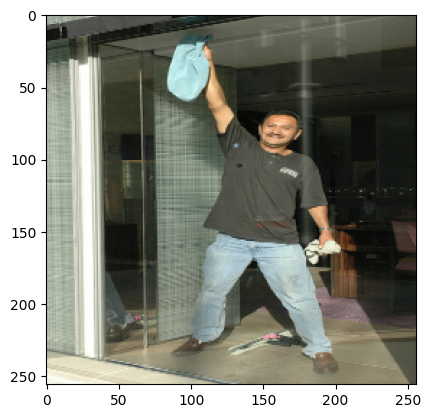

In [36]:
x = 1000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is standing on the street with white and white and black dog is walking <END>


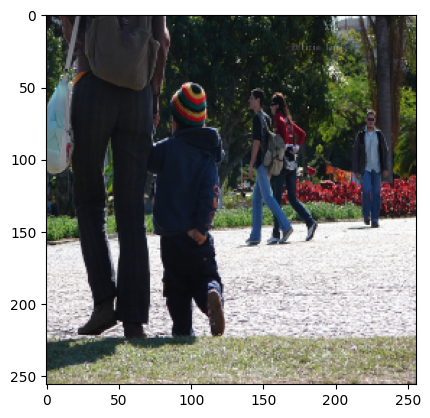

In [37]:
x = 2000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The woman is standing on the sidewalk <END>


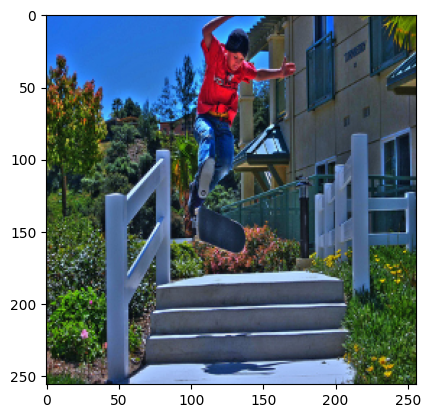

In [38]:
x = 3000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

In [39]:


losses = train_transformer(tot_img_seqs[:8000],tokenized_capts[:8000],onehot_capts_numpy[:8000],trans_model)


training started
epoch :  0 loss :  tf.Tensor(0.75833523, shape=(), dtype=float32)
epoch :  1 loss :  tf.Tensor(0.757607, shape=(), dtype=float32)
epoch :  2 loss :  tf.Tensor(0.7577392, shape=(), dtype=float32)
epoch :  3 loss :  tf.Tensor(0.75786525, shape=(), dtype=float32)
epoch :  4 loss :  tf.Tensor(0.75624543, shape=(), dtype=float32)
epoch :  5 loss :  tf.Tensor(0.7568293, shape=(), dtype=float32)
epoch :  6 loss :  tf.Tensor(0.7559853, shape=(), dtype=float32)
epoch :  7 loss :  tf.Tensor(0.75588906, shape=(), dtype=float32)
epoch :  8 loss :  tf.Tensor(0.7552078, shape=(), dtype=float32)
epoch :  9 loss :  tf.Tensor(0.75564384, shape=(), dtype=float32)
epoch :  10 loss :  tf.Tensor(0.7547973, shape=(), dtype=float32)
epoch :  11 loss :  tf.Tensor(0.7545347, shape=(), dtype=float32)
epoch :  12 loss :  tf.Tensor(0.7538142, shape=(), dtype=float32)
epoch :  13 loss :  tf.Tensor(0.75400794, shape=(), dtype=float32)
epoch :  14 loss :  tf.Tensor(0.7533968, shape=(), dtype=float32

The man in the blue shirt is holding up in his hand <END>


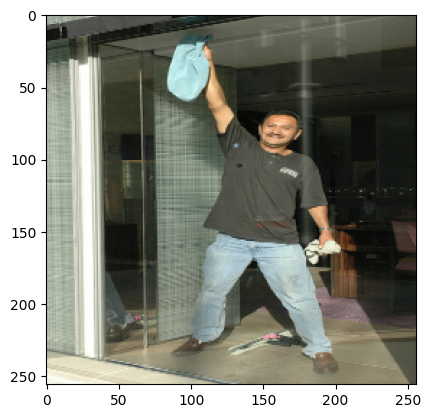

In [40]:
x = 1000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is standing on the street with white and white dog <END>


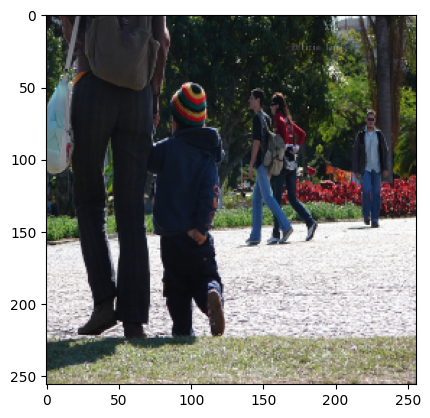

In [41]:
x = 2000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The woman is holding the child to the girl with red ball on her head <END>


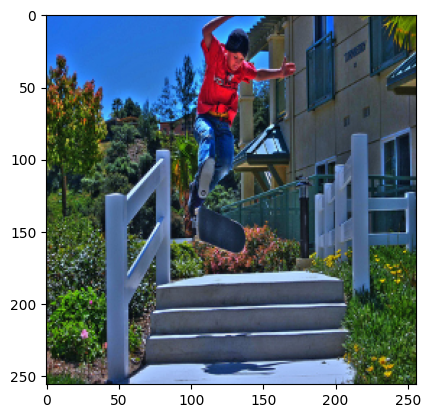

In [42]:
x = 3000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

In [43]:


losses = train_transformer(tot_img_seqs[:8000],tokenized_capts[:8000],onehot_capts_numpy[:8000],trans_model)


training started
epoch :  0 loss :  tf.Tensor(0.6520485, shape=(), dtype=float32)
epoch :  1 loss :  tf.Tensor(0.6510713, shape=(), dtype=float32)
epoch :  2 loss :  tf.Tensor(0.650918, shape=(), dtype=float32)
epoch :  3 loss :  tf.Tensor(0.6505605, shape=(), dtype=float32)
epoch :  4 loss :  tf.Tensor(0.64930826, shape=(), dtype=float32)
epoch :  5 loss :  tf.Tensor(0.64942366, shape=(), dtype=float32)
epoch :  6 loss :  tf.Tensor(0.649126, shape=(), dtype=float32)
epoch :  7 loss :  tf.Tensor(0.6487507, shape=(), dtype=float32)
epoch :  8 loss :  tf.Tensor(0.64763147, shape=(), dtype=float32)
epoch :  9 loss :  tf.Tensor(0.6475024, shape=(), dtype=float32)
epoch :  10 loss :  tf.Tensor(0.6467224, shape=(), dtype=float32)
epoch :  11 loss :  tf.Tensor(0.64700097, shape=(), dtype=float32)
epoch :  12 loss :  tf.Tensor(0.64797866, shape=(), dtype=float32)
epoch :  13 loss :  tf.Tensor(0.6462102, shape=(), dtype=float32)
epoch :  14 loss :  tf.Tensor(0.645166, shape=(), dtype=float32)
e

The man is wearing black shirt and holding up in blue shirt <END>


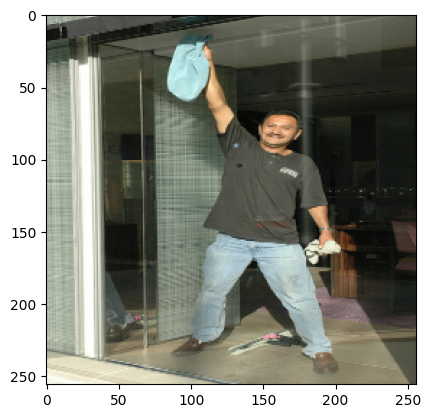

In [44]:
x = 1000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The young man is wearing white shirt and holding camera <END>


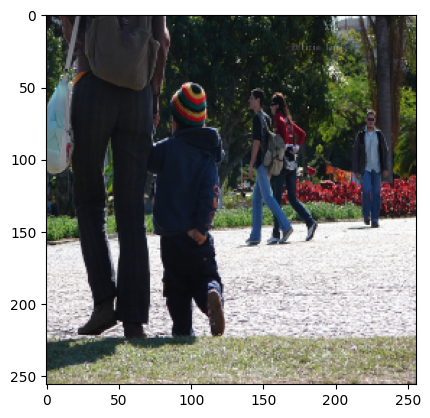

In [45]:
x = 2000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The woman is holding an orange toy car on the ground <END>


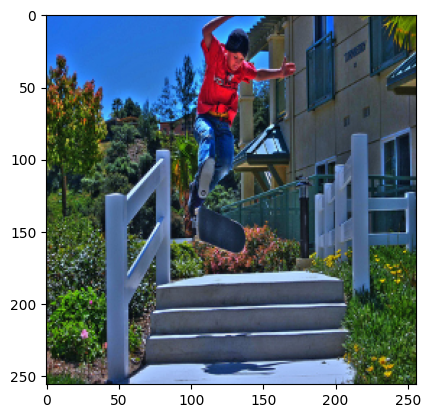

In [46]:
x = 3000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

In [47]:


losses = train_transformer(tot_img_seqs[:8000],tokenized_capts[:8000],onehot_capts_numpy[:8000],trans_model)


training started
epoch :  0 loss :  tf.Tensor(0.52563107, shape=(), dtype=float32)
epoch :  1 loss :  tf.Tensor(0.5266206, shape=(), dtype=float32)
epoch :  2 loss :  tf.Tensor(0.5264033, shape=(), dtype=float32)
epoch :  3 loss :  tf.Tensor(0.52273273, shape=(), dtype=float32)
epoch :  4 loss :  tf.Tensor(0.5239086, shape=(), dtype=float32)
epoch :  5 loss :  tf.Tensor(0.53756356, shape=(), dtype=float32)
epoch :  6 loss :  tf.Tensor(0.5240688, shape=(), dtype=float32)
epoch :  7 loss :  tf.Tensor(0.5218065, shape=(), dtype=float32)
epoch :  8 loss :  tf.Tensor(0.52161765, shape=(), dtype=float32)
epoch :  9 loss :  tf.Tensor(0.5239908, shape=(), dtype=float32)
epoch :  10 loss :  tf.Tensor(0.52162606, shape=(), dtype=float32)
epoch :  11 loss :  tf.Tensor(0.5230438, shape=(), dtype=float32)
epoch :  12 loss :  tf.Tensor(0.5213096, shape=(), dtype=float32)
epoch :  13 loss :  tf.Tensor(0.5188298, shape=(), dtype=float32)
epoch :  14 loss :  tf.Tensor(0.51850605, shape=(), dtype=float3

The man is wearing black shirt and holding blue shirt and white shorts in green shirt <END>


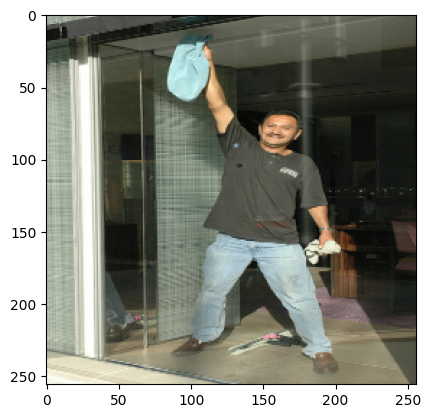

In [48]:
x = 1000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is walking with white dog <END>


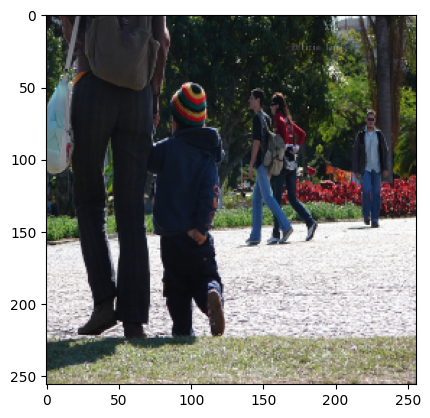

In [49]:
x = 2000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The boy is playing on the rocks for the ball <END>


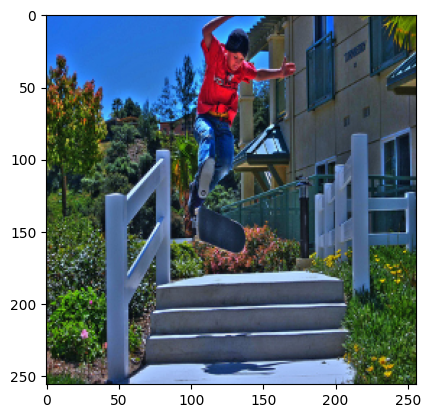

In [50]:
x = 3000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

In [51]:


losses = train_transformer(tot_img_seqs[:8000],tokenized_capts[:8000],onehot_capts_numpy[:8000],trans_model)


training started
epoch :  0 loss :  tf.Tensor(0.40298048, shape=(), dtype=float32)
epoch :  1 loss :  tf.Tensor(0.40242827, shape=(), dtype=float32)
epoch :  2 loss :  tf.Tensor(0.39815477, shape=(), dtype=float32)
epoch :  3 loss :  tf.Tensor(0.40162343, shape=(), dtype=float32)
epoch :  4 loss :  tf.Tensor(0.39780182, shape=(), dtype=float32)
epoch :  5 loss :  tf.Tensor(0.39997718, shape=(), dtype=float32)
epoch :  6 loss :  tf.Tensor(0.3992692, shape=(), dtype=float32)
epoch :  7 loss :  tf.Tensor(0.39866638, shape=(), dtype=float32)
epoch :  8 loss :  tf.Tensor(0.39955643, shape=(), dtype=float32)
epoch :  9 loss :  tf.Tensor(0.39667153, shape=(), dtype=float32)
epoch :  10 loss :  tf.Tensor(0.3975758, shape=(), dtype=float32)
epoch :  11 loss :  tf.Tensor(0.39938506, shape=(), dtype=float32)
epoch :  12 loss :  tf.Tensor(0.39710176, shape=(), dtype=float32)
epoch :  13 loss :  tf.Tensor(0.3964827, shape=(), dtype=float32)
epoch :  14 loss :  tf.Tensor(0.39727357, shape=(), dtype=

The man is wearing black shirt and holding up blue shirt and holding up in some snow <END>


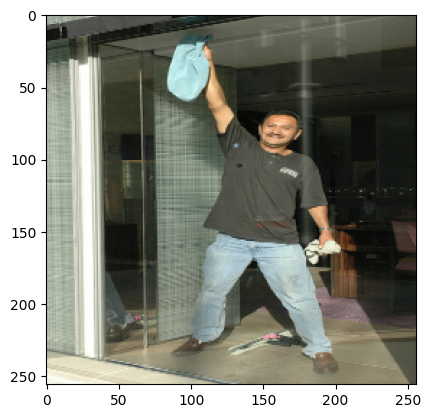

In [55]:
x = 1000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is walking with young child outside <END>


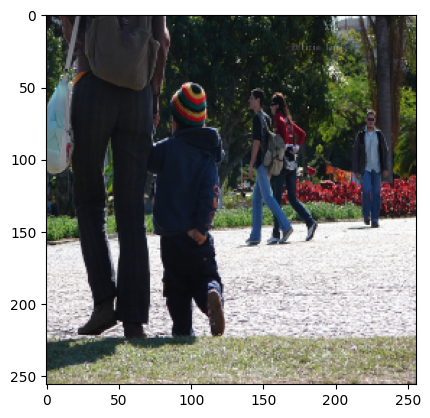

In [56]:
x = 2000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The boy is skateboarding on the stairs <END>


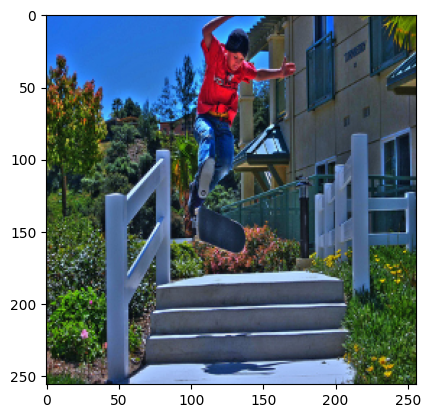

In [57]:
x = 3000

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)

The man is performing trick on ramp <END>
The girl in the bright red outfit is skipping across the path .


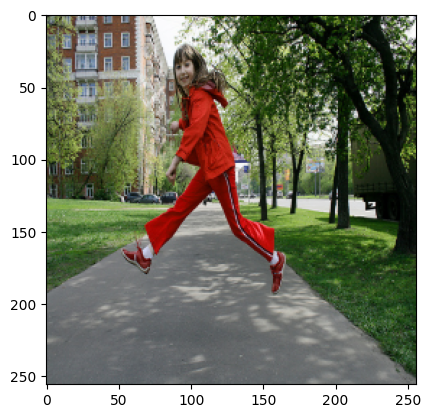

In [70]:
x = 8080

plt.imshow(tot_images[x])
output_caption,cross_scores,result_scores,self_scores = get_date_trans(tot_img_seqs[x:x+1],trans_model)  
print(output_caption)
print(corresponding_captions[x])